In [13]:
import seaborn as sns
from sklearn.model_selection import train_test_split
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, f1_score, classification_report, roc_curve, auc, confusion_matrix, roc_auc_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from sklearn.naive_bayes import GaussianNB
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import cross_validate
from sklearn.neural_network import MLPClassifier
from sklearn.utils.multiclass import unique_labels
from sklearn.tree import export_graphviz #plot tree
from sklearn.metrics import roc_curve, auc #for model evaluation
from sklearn.metrics import confusion_matrix #for model evaluation
import eli5 #for purmutation importance
from eli5.sklearn import PermutationImportance
import shap #for SHAP values
from IPython.display import display, HTML
from pdpbox import pdp, info_plots #for partial plots
import joblib, os
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.preprocessing import label_binarize



scoring = {'acc': 'accuracy',
           'prec_macro': 'precision_macro',
           'rec_macro': 'recall_macro',
           'f1_macro':'f1_macro'}


models_transfer = {
    'knn':'KNN',
    'knn_im':'KNN',
    'svm':'SVM',
    'svm_im':'SVM',
    'random':'RF',
    'random_im':'RF',
    'gb':'GB',
    'gb_im':'GB',
    'mlp':'MLP',
    'mlp_im':'MLP',
    'nb':'NB',
    'nb_im':'NB'
}


models_names = {
    'knn':'Balanced',
    'knn_im':'Imbalanced',
    'svm':'Balanced',
    'svm_im':'Imbalanced',
    'random':'Balanced',
    'random_im':'Imbalanced',
    'gb':'Balanced',
    'gb_im':'Imbalanced',
    'mlp':'Balanced',
    'mlp_im':'Imbalanced',
    'nb':'Balanced',
    'nb_im':'Imbalanced'
}


title = '156selected_156_1130'
KFOLD = 10
N_JOBS = 10


def mkdir(path):
    path = path.strip()
    path = path.rstrip("\\")
    isExists = os.path.exists(path)

    if not isExists:
        os.makedirs(path)
        return True
    else:
        return False


def preprocess(countpath, testsize = 0.2, randomstate = 1):
    x = pd.read_csv('%s' % countpath, index_col=0).T

    # get feature names
    featurenames = np.array(x.index)

    # get label names
    x = x.T
    y = list(np.array(x.index))
    label = sorted(list(set(y)), key = y.index)
    
    df = x
    df['target'] = y

    for classname in label:
        count_temp = len(df[df.target == classname])
        print("Proportion of family {0}: {1:.2f}%".format(classname, (count_temp / (len(df.target)) * 100)))


    y = df.target.values
    x= df.drop(['target'], axis=1)
    
    x = x.dropna(axis=1, how='any')  # drop all rows that have any NaN value
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = testsize, random_state = randomstate)

    return x_train, y_train, x_test, y_test, featurenames, label, df



def heat_norm_col(label, featurenames, x_train, counting):
    heat = pd.DataFrame(0, index=np.arange(len(label)), columns=np.arange(featurenames.size))
    heat.index = label
    heat.columns = featurenames
    for i in range(0, len(x_train.index)):
        for j in range(0, len(x_train.columns)):
            heat.loc[x_train.index[i], x_train.columns[j]] = heat.loc[x_train.index[i], x_train.columns[j]] + x_train.iloc[i, j]


    heat_norm = heat
    for i in range(0, len(heat_norm.index)):
        for j in range(0, len(heat_norm.columns)):
            heat_norm.iloc[i, j] = heat_norm.iloc[i, j] / counting[heat_norm.index[i]]

#     fig, ax = plt.subplots(figsize=(10,15), dpi = 220)
    # Now if we normalize it by column:
    heat_norm_col = heat_norm
    heat_norm_col=(heat_norm_col-heat_norm_col.mean())/heat_norm_col.std()

    return heat_norm_col


def counting(label, y_train):
    counting = {}
    for i in label:
        count = 0
        for j in y_train:
            if i == j:
                count = count+1        
        counting[i] = count
    print(counting)
    
    return counting


def smote_dict(label, counting):
    dict = {}
    for i in label:
        if i == 'RF00168':
            dict[i] = counting[i] * 6
        elif counting[i] > 1000:
            dict[i] = counting[i]
        elif counting[i] > 700:
            dict[i] = counting[i] * 2
        elif counting[i] > 500:
            dict[i] = counting[i] * 3
        elif counting[i] > 200:
            dict[i] = counting[i] * 5
        else:
            dict[i] = counting[i] * 10
    print(dict)
    return dict


def addtwodimdict(dict, key_a, key_b, val): 
    if key_a in adic:
        dict[key_a].update({key_b: val})
    else:
        dict.update({key_a:{key_b: val}})


def save(model, model_name):
    joblib.dump(model, './Model/%s_%s.pkl' % (model_name, title))

    
def load(model_name):
    return joblib.load('./Model/%s_%s.pkl' % (model_name, title))


def plot_confusion_matrix(model, model_name, label, balance = 'Balanced', cmap = plt.cm.Blues, normalize = True):
#     model.fit(x_train, y_train)
    pred = model.predict(x_test)
    confusion = confusion_matrix(y_test, pred)
    
    mkdir('./Figures/%s' % title)
    plot_con_matrix(confusion, model_name, label, featurenames = label, balance = balance, normalize=normalize, 
                    title = 'Normalized Confusion Matrix of %s %s Model with 156 Features' % (balance, model_name) , cmap = cmap)


def plot_feature_distribution_heatmap(heat_norm_col,label, featurenames, cmp = plt.cm.Blues):
    
    mkdir('./Figures/%s' % title)
    plot_feature_distribution_matrix(heat_norm_col.T, label, featurenames, normalize = False, 
                                     title = 'Normalized Feature Distribution of Every Family', cmap = cmp)
    

def plot_con_matrix(cm, model_name, classes, featurenames = None,balance = 'Balanced',
                          normalize = False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    
    SMALL_SIZE = 13
    MEDIUM_SIZE = 19
    BIGGER_SIZE = 23

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('xtick', labelsize=17)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=17)    # fontsize of the tick labels
    
    fig, ax = plt.subplots(figsize = (16, 12), dpi = 330)
    
    my_cmap = plt.cm.get_cmap(cmap)
    my_cmap.set_under('w')
    im = ax.imshow(cm, interpolation='nearest',cmap = my_cmap,vmin=0.02)
    ax.figure.colorbar(im, ax=ax)
    
    
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, 
           yticklabels = classes if featurenames == None else featurenames,
          )
    
    fig.suptitle('%s' % title, fontsize=BIGGER_SIZE)    
    plt.xlabel('Predicted Family', fontsize=MEDIUM_SIZE)
    plt.ylabel('True Family', fontsize=MEDIUM_SIZE)
    
    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    
    # Adjust the space between ticks and label
    ax.tick_params(axis='both', which='major', pad=5)
    
    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] >= 0.02:
                ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black")
    bottom, top = ax.get_ylim()
#     ax.set_ylim(bottom + 0.5, top - 0.5)
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    
    plt.show()
    
    fig.savefig('./Figures/%s/confusion_matrix_0423_%s_%s.pdf' % (globals()['title'], model_name, balance), format='pdf', bbox_inches='tight')
    
    return fig, ax


def plot_feature_distribution_matrix(cm, classes, featurenames, normalize = False,title=None, cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Standardized Feature Distribution'
        else:
            title = 'Not Standardized Feature Distribution'

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    SMALL_SIZE = 14
    MEDIUM_SIZE = 16
    BIGGER_SIZE = 20
    TICK_SIZE = 18

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('xtick', labelsize=TICK_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=TICK_SIZE)    # fontsize of the tick labels
    
    my_cmap = plt.cm.get_cmap(cmap)
    my_cmap.set_under('w')
    
    cbar_kws = {
            'orientation':'horizontal',
            'shrink':3,
            'ticks':np.arange(-5, 5),
            'extendfrac':0.5
           }

    plt.figure()
    ax = sns.clustermap(heat_norm_modi.T, cmap =cmap, figsize = (16, 110), center = 0.6, z_score=0, col_cluster=False, cbar = False)
    
    # We want to show all ticks...
#     ax.set(xticks=np.arange(cm.shape[1]),
#            yticks=np.arange(cm.shape[0]),
#            # ... and label them with the respective list entries
#            xticklabels = classes, 
#            yticklabels = featurenames,
#           )
    
    ax.fig.suptitle('%s' % title, fontsize=BIGGER_SIZE)    
    plt.xlabel('Family Names', fontsize=MEDIUM_SIZE)
    plt.ylabel('Feature Names', fontsize=MEDIUM_SIZE)
    
    plt.setp(ax.ax_heatmap.get_yticklabels(), fontsize = TICK_SIZE)  # For y axis
    plt.setp(ax.ax_heatmap.get_xticklabels(), rotation=45, fontsize = TICK_SIZE) # For x axis

#     # Adjust the space between ticks and label
#     ax.tick_params(axis='both', which='major', pad=6)
    
    ax.fig.tight_layout(rect=[0, 0.1, 1, 0.975])
#     fig.tight_layout()
    plt.show()
    
    ax.fig.savefig('./Figures/%s/Feature_distribution.pdf' % (globals()['title']), format='pdf', bbox_inches='tight')

# corrlation matrix heatmap

In [33]:
def plot_corr_matrix(cm, featurenames, normalize = False,title=None, cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    
    SMALL_SIZE = 28
    MEDIUM_SIZE = 34
    BIGGER_SIZE = 40
    TICK_SIZE = 9

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('xtick', labelsize=TICK_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=TICK_SIZE)    # fontsize of the tick labels
    
    fig, ax = plt.subplots(figsize = (44, 36), dpi = 330)
#     fig, ax = plt.subplots(figsize = (16, 48))
    my_cmap = plt.cm.get_cmap(cmap)
#     my_cmap.set_over('w')
    im = ax.imshow(cm, interpolation='nearest',cmap = my_cmap, vmin = -0.85, vmax =0.85)
    ax.figure.colorbar(im, ax=ax, extend="both", orientation='horizontal', shrink = 0.69, pad = 0.06, aspect = 40)
    
    
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels = featurenames, 
           yticklabels = featurenames,
          )
    
    fig.suptitle('%s' % title, fontsize=BIGGER_SIZE)    
    plt.xlabel('Features', fontsize=MEDIUM_SIZE)
    plt.ylabel('Features', fontsize=MEDIUM_SIZE)
    
    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=60, ha="right",
             rotation_mode="anchor")
    
    # Adjust the space between ticks and label
    ax.tick_params(axis='both', which='major', pad=5)
    
    # Loop over data dimensions and create text annotations.
    fmt = '.1f'
    thresh = 0
    for i in range(0, cm.shape[0]):
        for j in range(0, cm.shape[1]):
            pass
#             if cm.iloc[i, j] <= -0.5 or cm.iloc[i, j] >=0.5:
#                 ax.text(j, i, format(cm.iloc[i, j], fmt),
#                         ha="center", va="center",
#                         color="white" if (cm.iloc[i, j] > thresh) else "black")
    print(i, j)
    bottom, top = ax.get_ylim()
#     ax.set_ylim(bottom + 0.5, top - 0.5)
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    
    plt.show()
    
    fig.savefig('./Figures/%s/corr_matrix.pdf' % (globals()['title']), format='pdf', bbox_inches='tight')
    
    return fig, ax

In [34]:
corr = dataframe.corr()

In [35]:
plot_corr_matrix(corr, featurenames, normalize = False, title='Correlation Matrix of 156 Features', cmap=plt.cm.RdBu)

Confusion matrix, without normalization
155 155


(<Figure size 14520x11880 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f53c3108da0>)

In [40]:
heat_norm_modi = pd.read_csv('./heat_norm_156_modi.csv',index_col=0)

In [7]:
if __name__ == '__main__':
    countpath = './156_new_selected_156.csv'

    x_train, y_train, x_test, y_test, featurenames, label, dataframe = preprocess(countpath, 0.3, 3)
    
    
#     mkdir('./Prediction_output_%s/Classification_report' % title)
    count = counting(label, y_train)
    dict = smote_dict(label, count)
   

Proportion of family RF00050: 7.48%
Proportion of family RF00059: 22.34%
Proportion of family RF00162: 7.67%
Proportion of family RF00167: 5.02%
Proportion of family RF00168: 2.11%
Proportion of family RF00174: 26.48%
Proportion of family RF00234: 1.70%
Proportion of family RF00380: 1.34%
Proportion of family RF00504: 13.13%
Proportion of family RF00521: 1.03%
Proportion of family RF00522: 0.72%
Proportion of family RF00634: 1.33%
Proportion of family RF01051: 6.30%
Proportion of family RF01054: 0.24%
Proportion of family RF01055: 1.87%
Proportion of family RF01057: 1.22%
{'RF00050': 827, 'RF00059': 2551, 'RF00162': 852, 'RF00167': 587, 'RF00168': 245, 'RF00174': 2993, 'RF00234': 181, 'RF00380': 152, 'RF00504': 1491, 'RF00521': 133, 'RF00522': 81, 'RF00634': 155, 'RF01051': 701, 'RF01054': 21, 'RF01055': 210, 'RF01057': 148}
{'RF00050': 1654, 'RF00059': 2551, 'RF00162': 1704, 'RF00167': 1761, 'RF00168': 1470, 'RF00174': 2993, 'RF00234': 1810, 'RF00380': 1520, 'RF00504': 1491, 'RF00521'

# Confusion matrix

Normalized confusion matrix


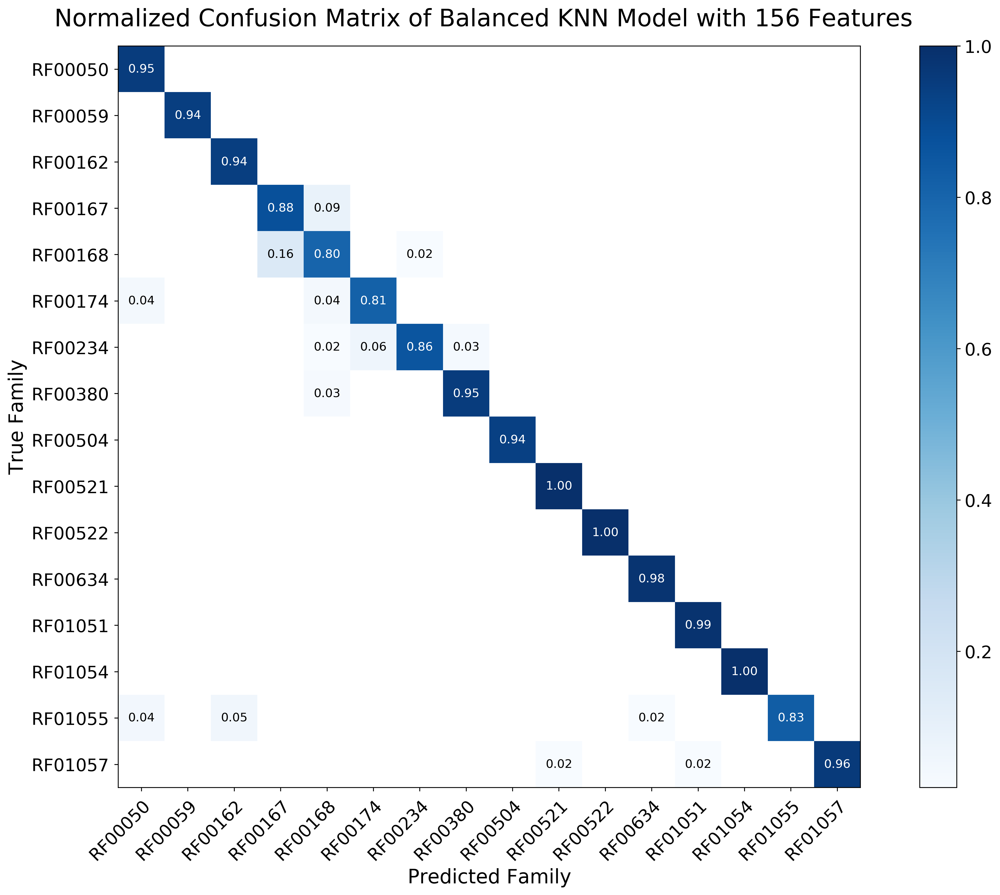

Normalized confusion matrix


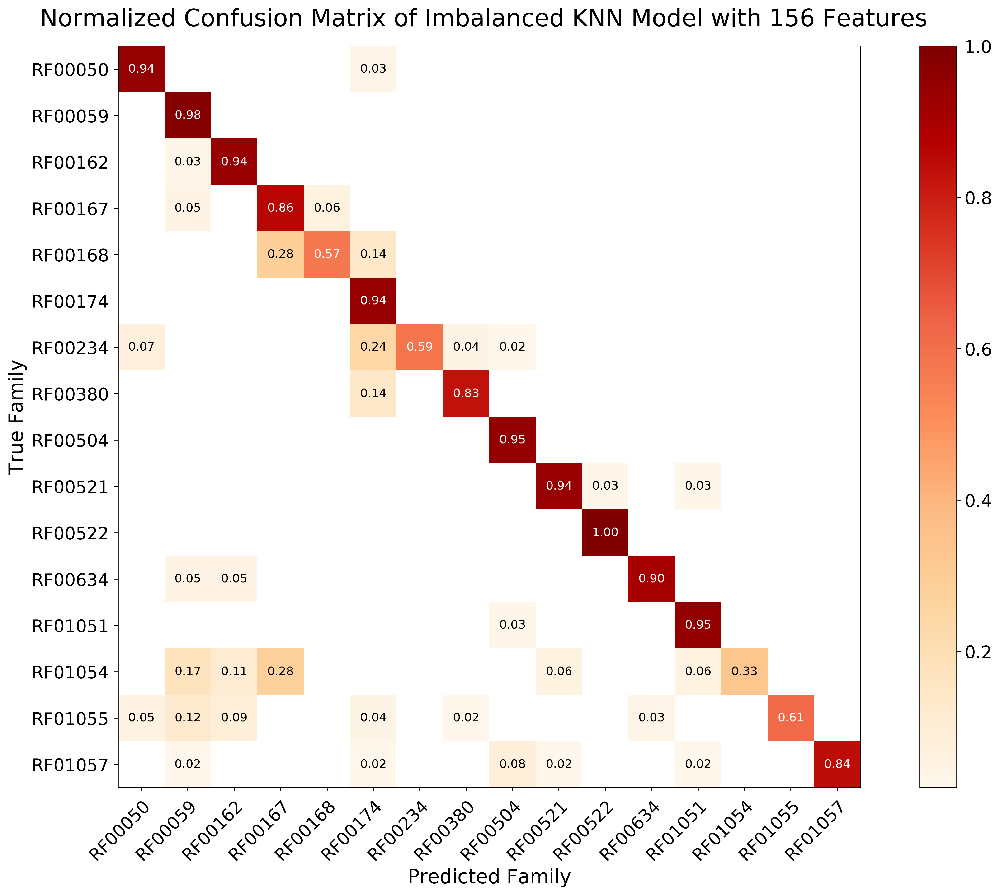

Normalized confusion matrix


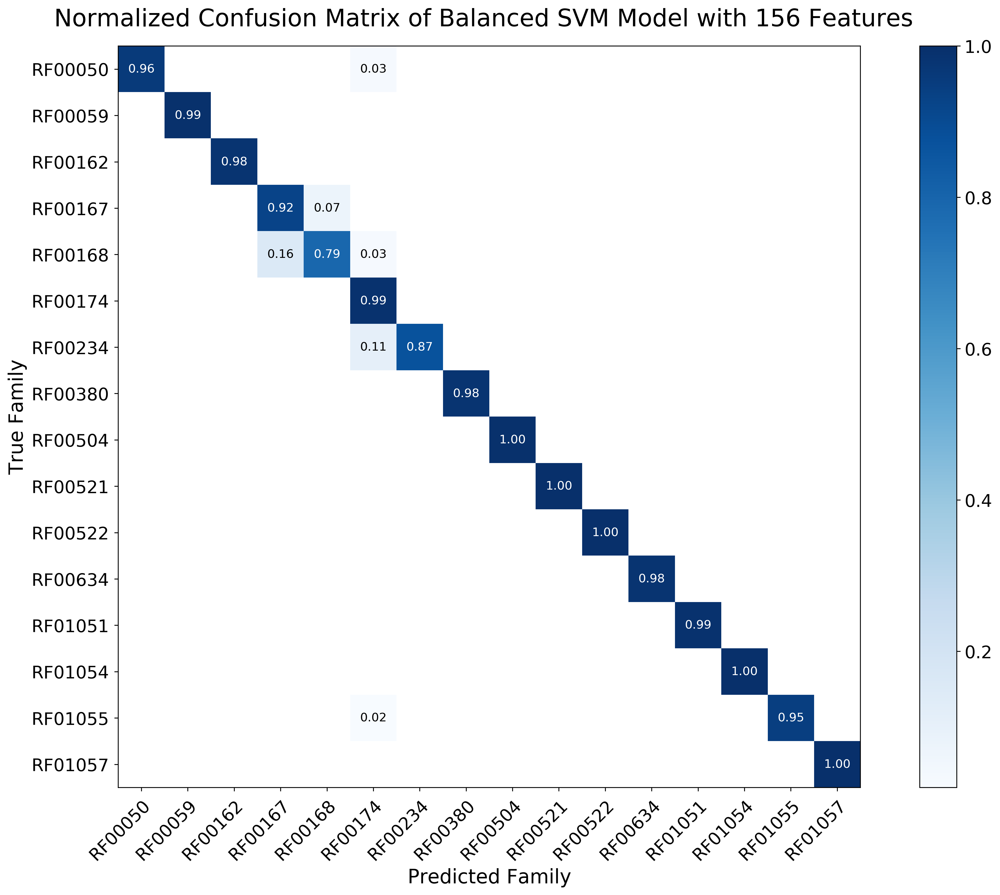

Normalized confusion matrix


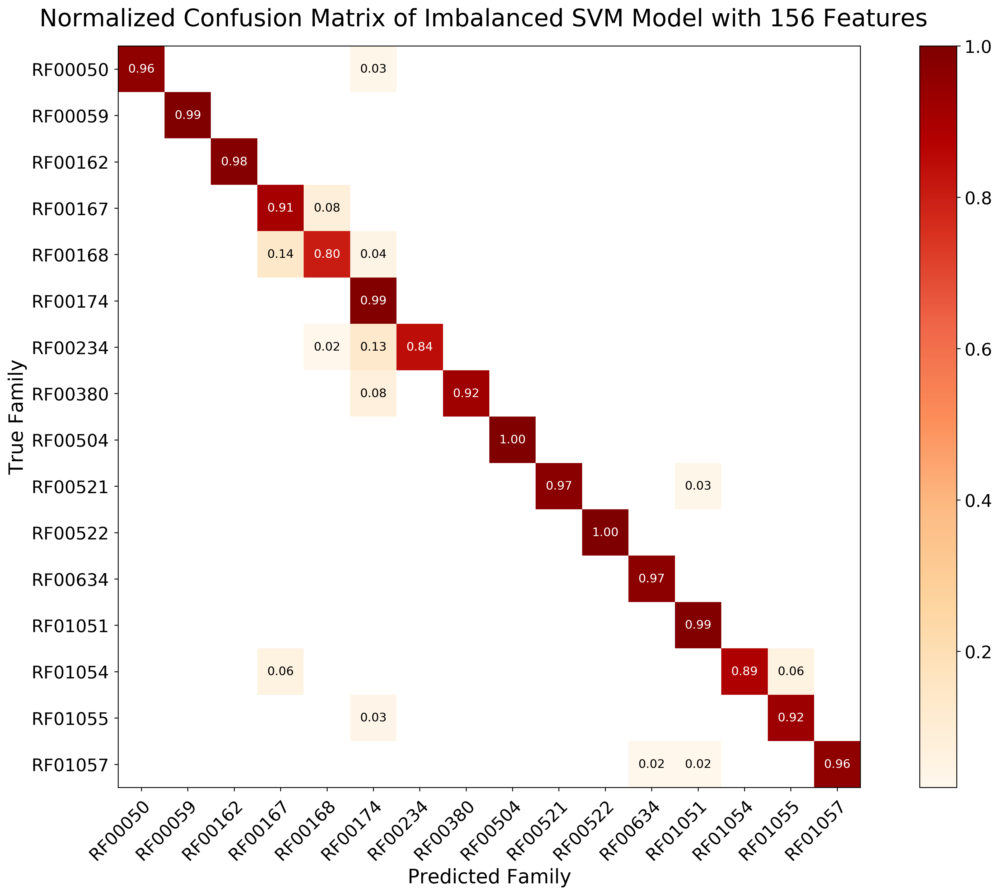

Normalized confusion matrix


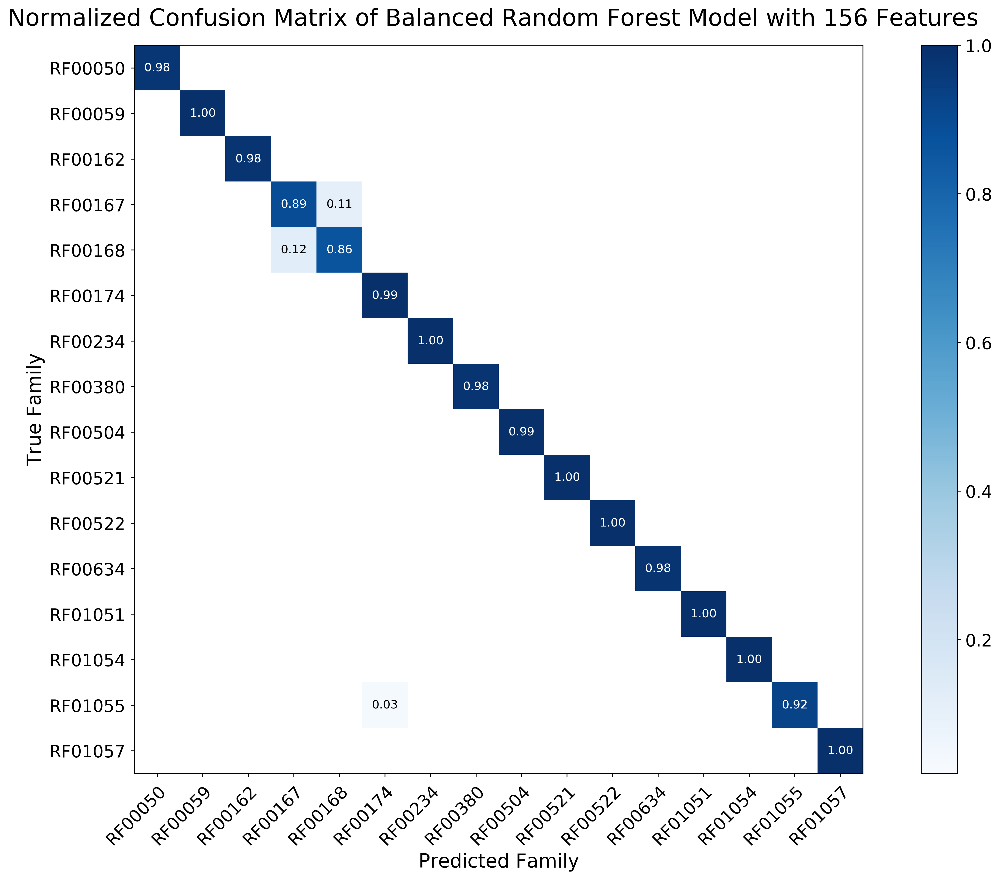

Normalized confusion matrix


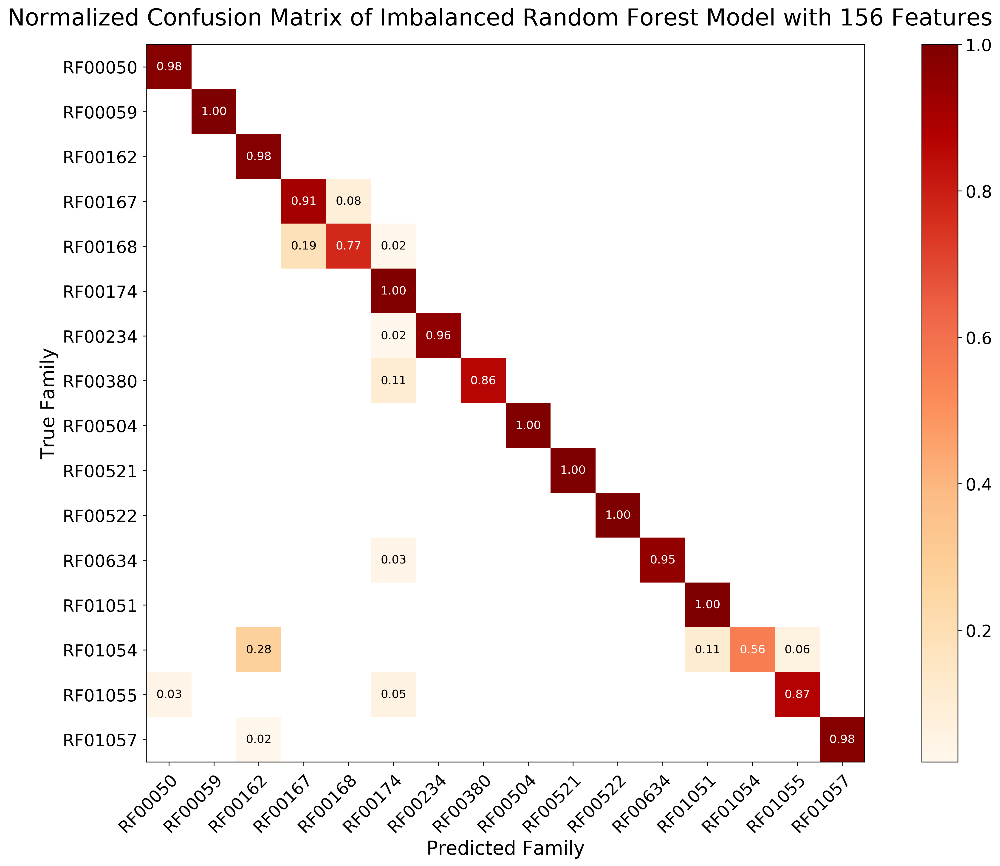

Normalized confusion matrix


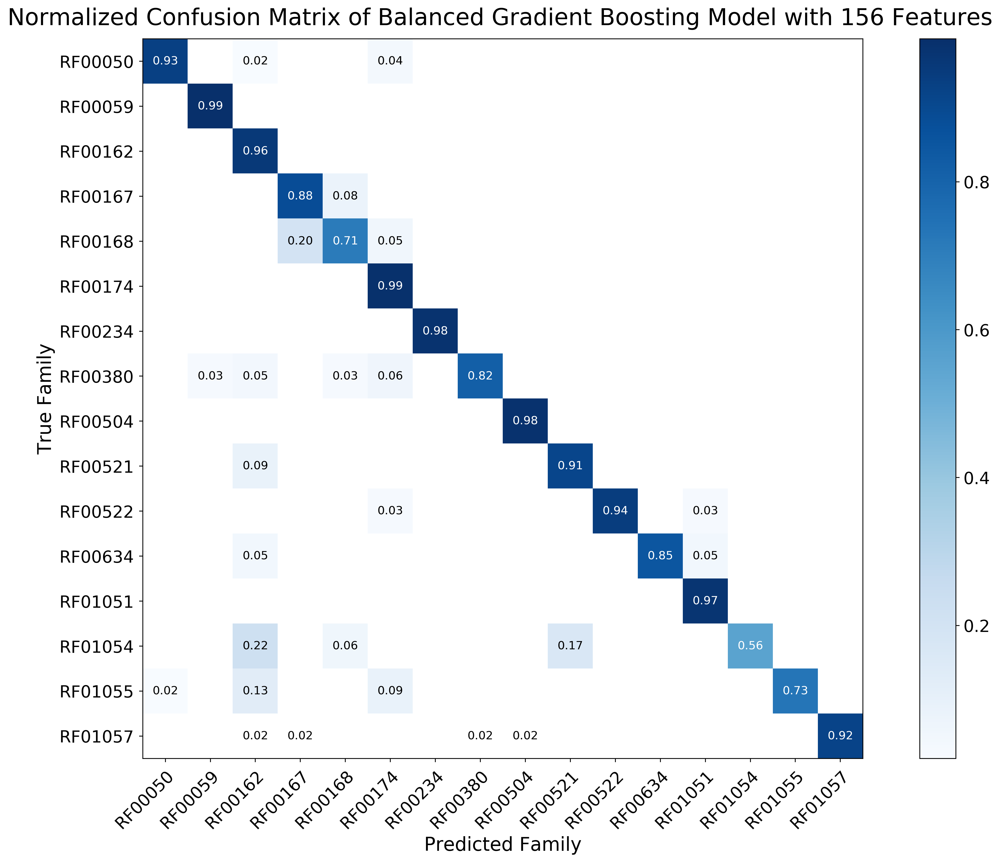

Normalized confusion matrix


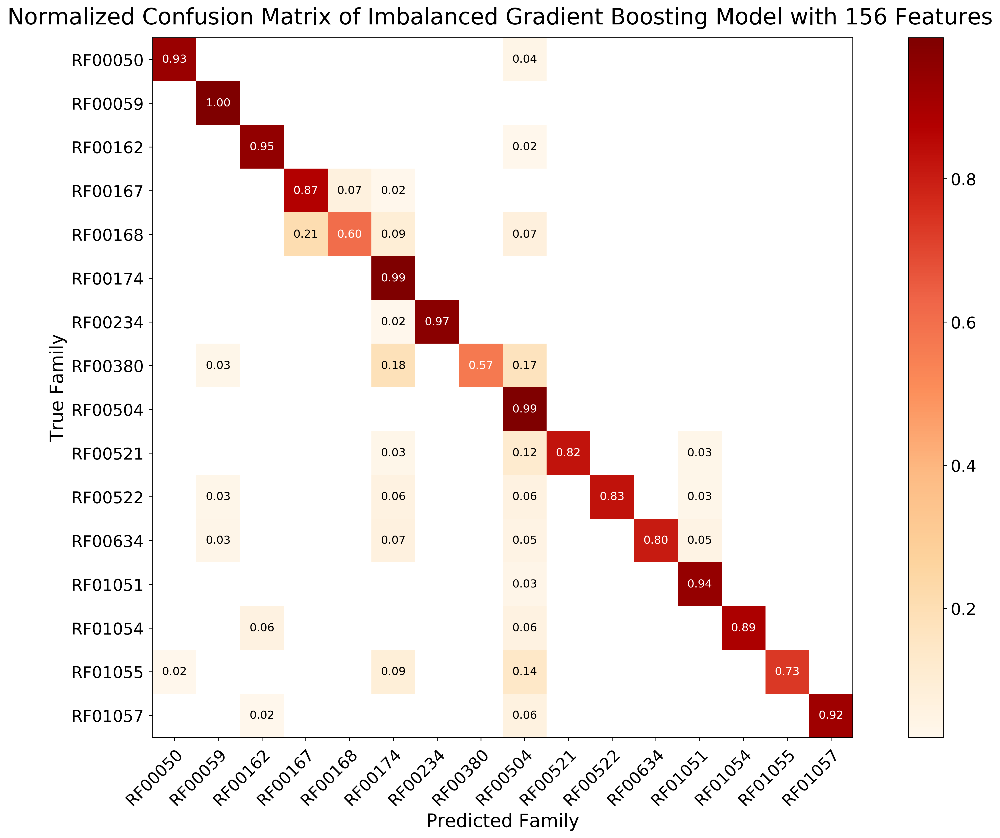

Normalized confusion matrix


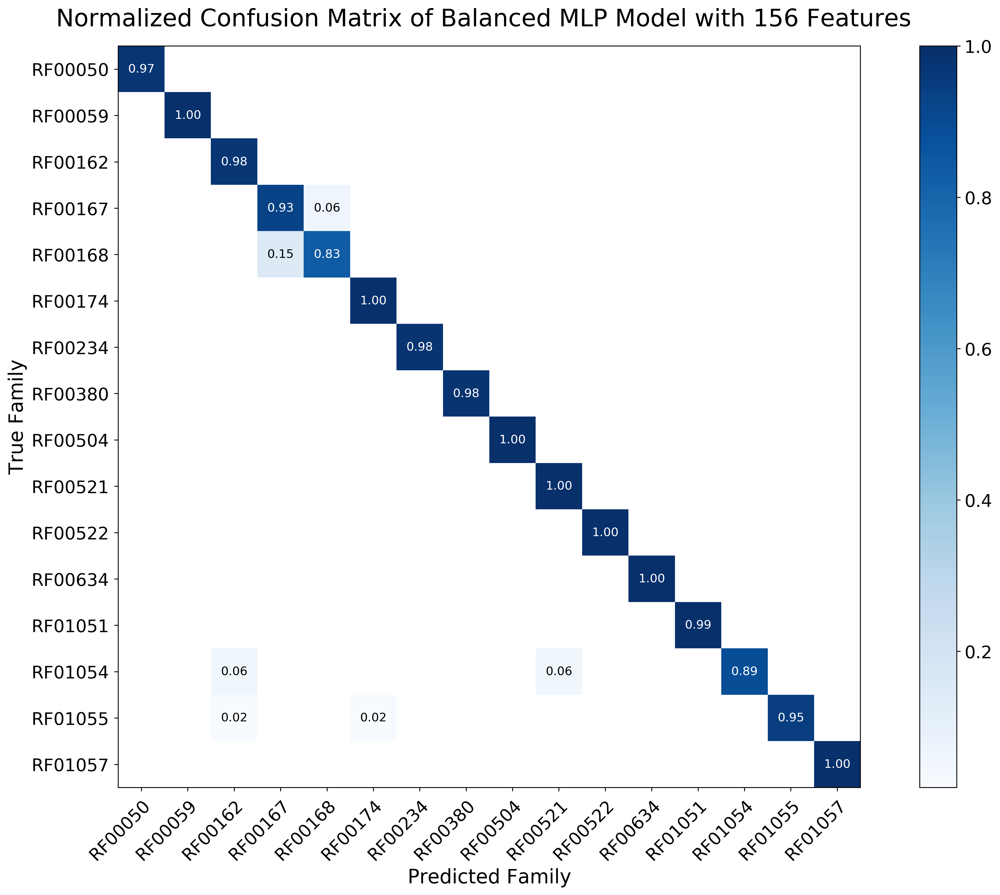

Normalized confusion matrix


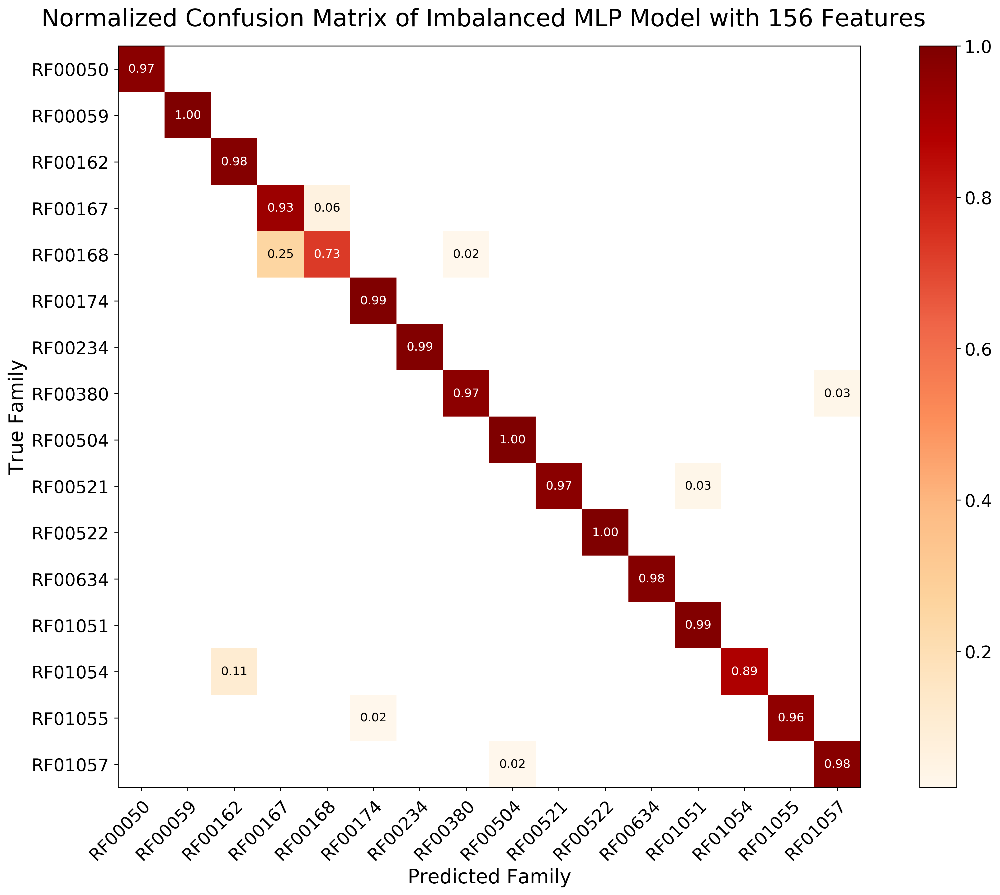

Normalized confusion matrix


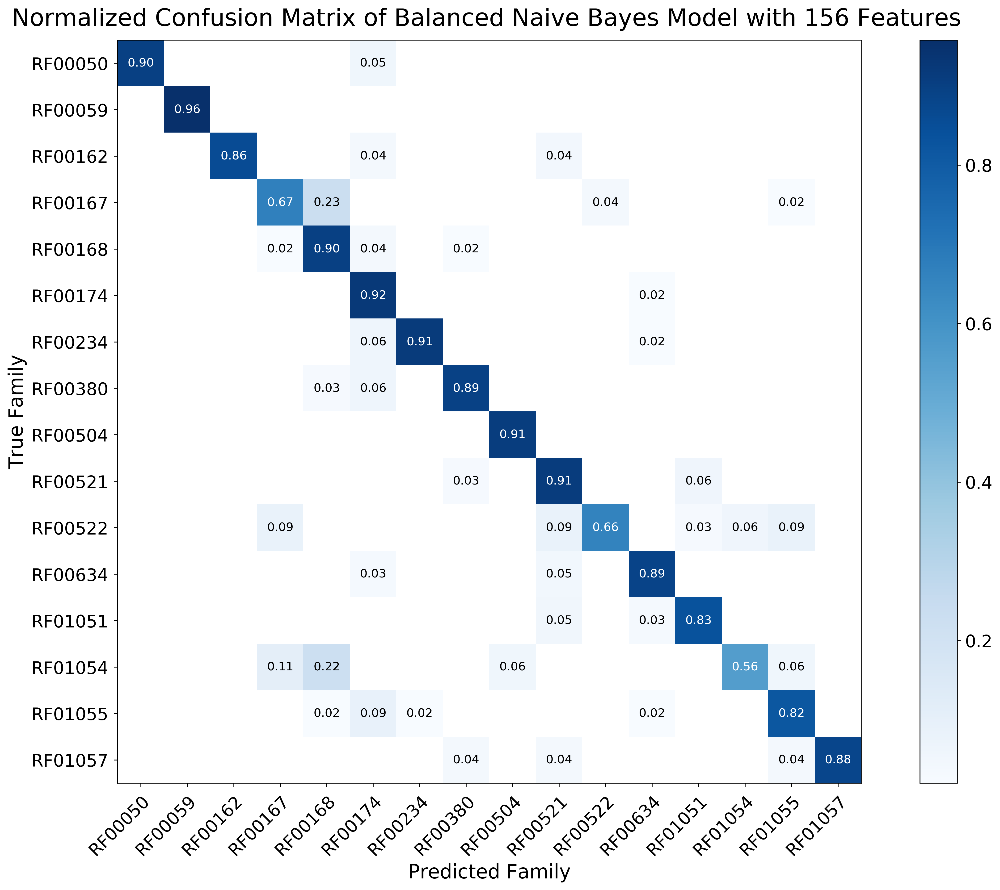

Normalized confusion matrix


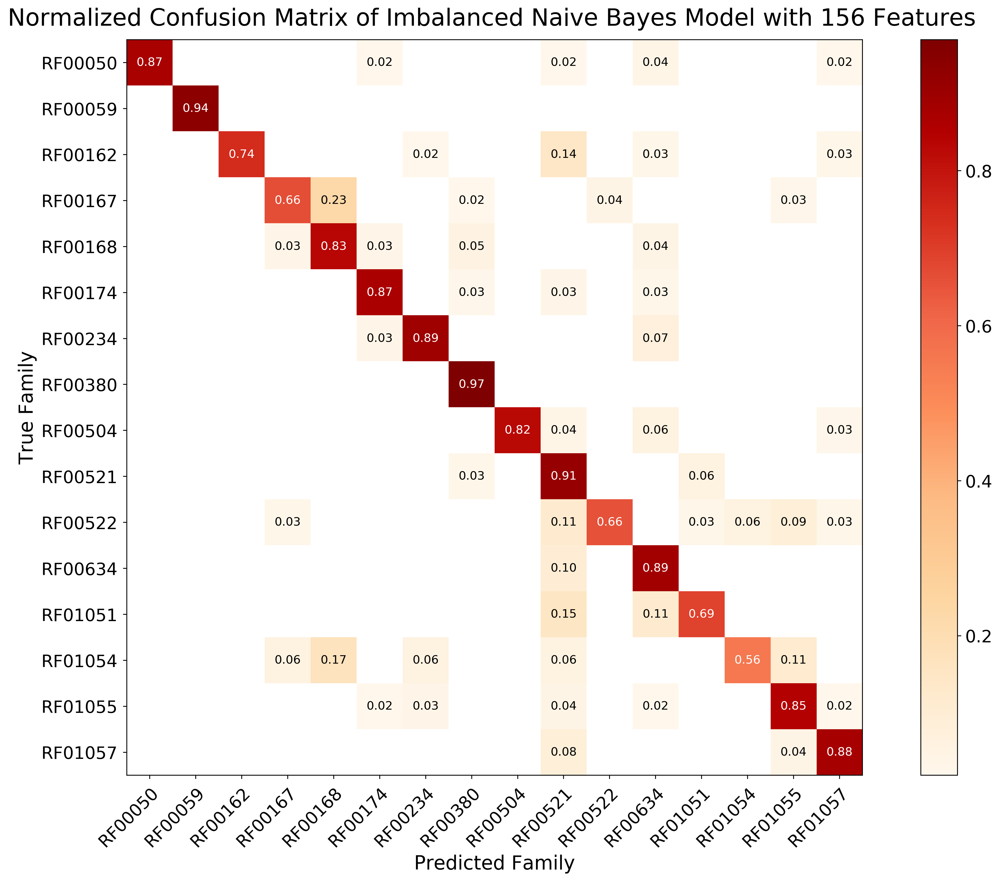

In [37]:
for model_name, balance in zip(models_names.keys(),models_names.values()):
    model = load(model_name)
    if balance == 'Imbalanced':
        cmap = plt.cm.OrRd
    else:
        cmap = plt.cm.Blues
    plot_confusion_matrix(model, models_transfer[model_name], label, balance = balance, normalize = True, cmap = cmap)

Normalized confusion matrix


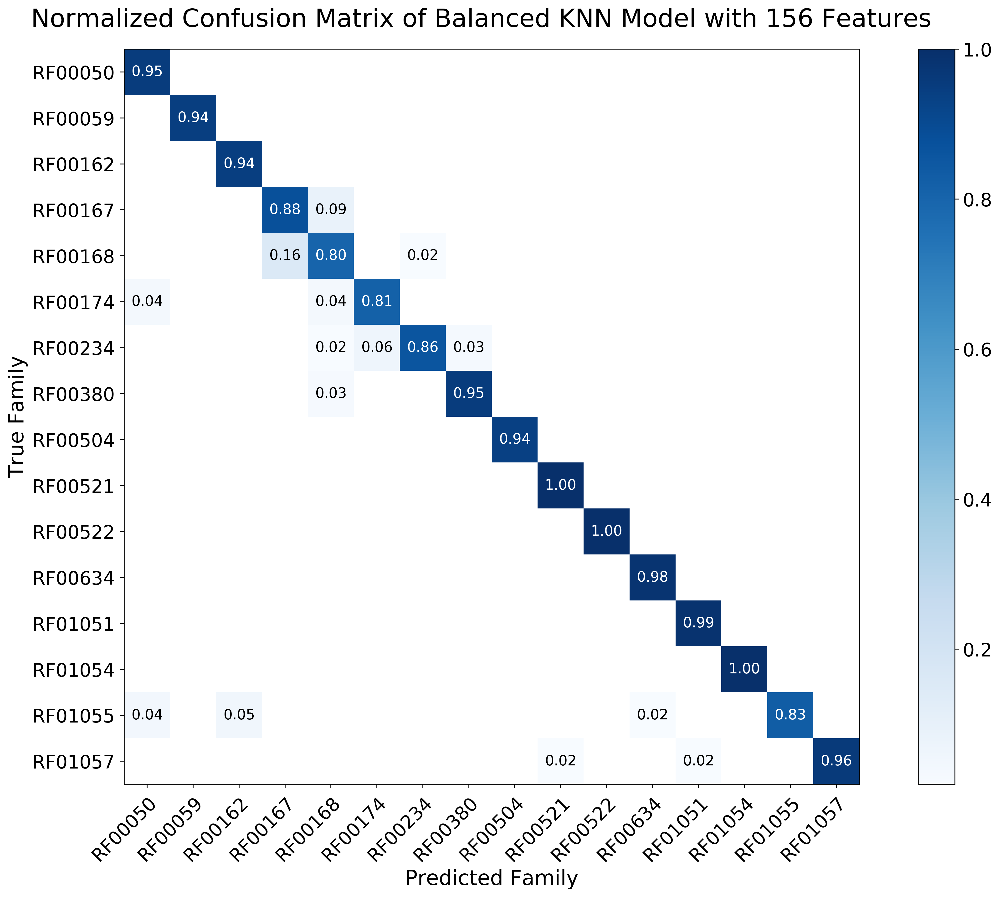

Normalized confusion matrix


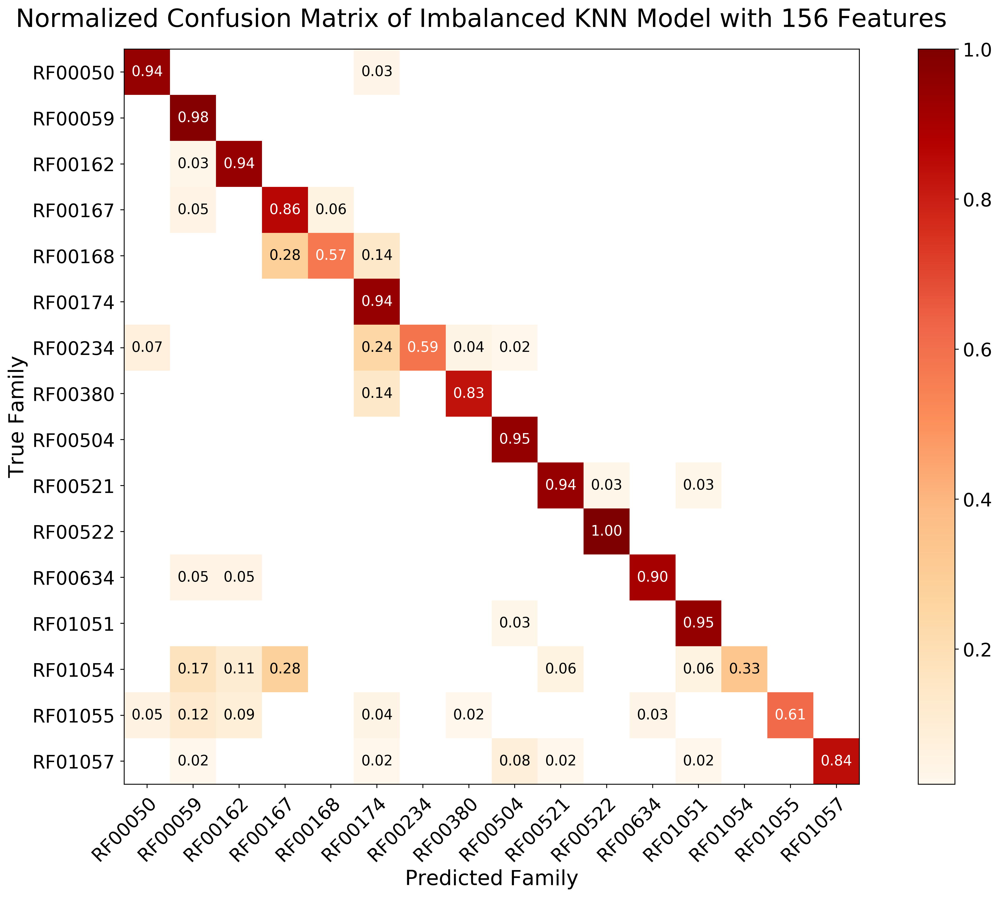

Normalized confusion matrix


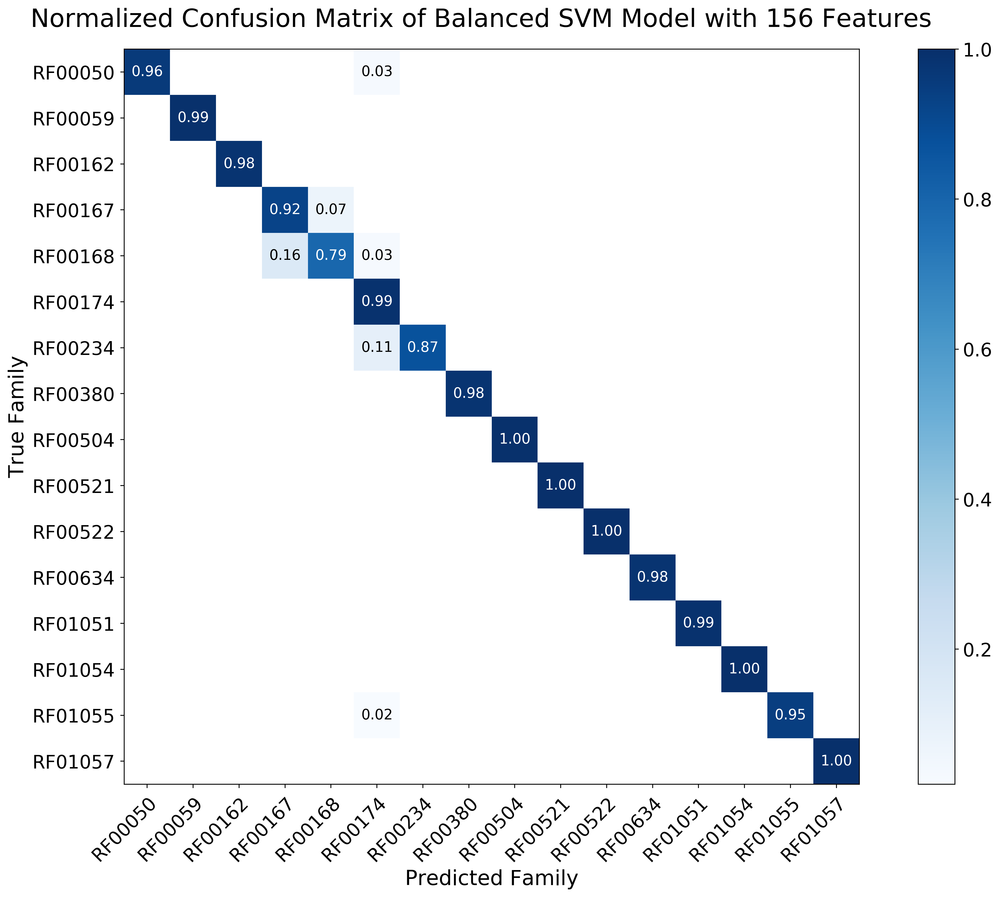

Normalized confusion matrix


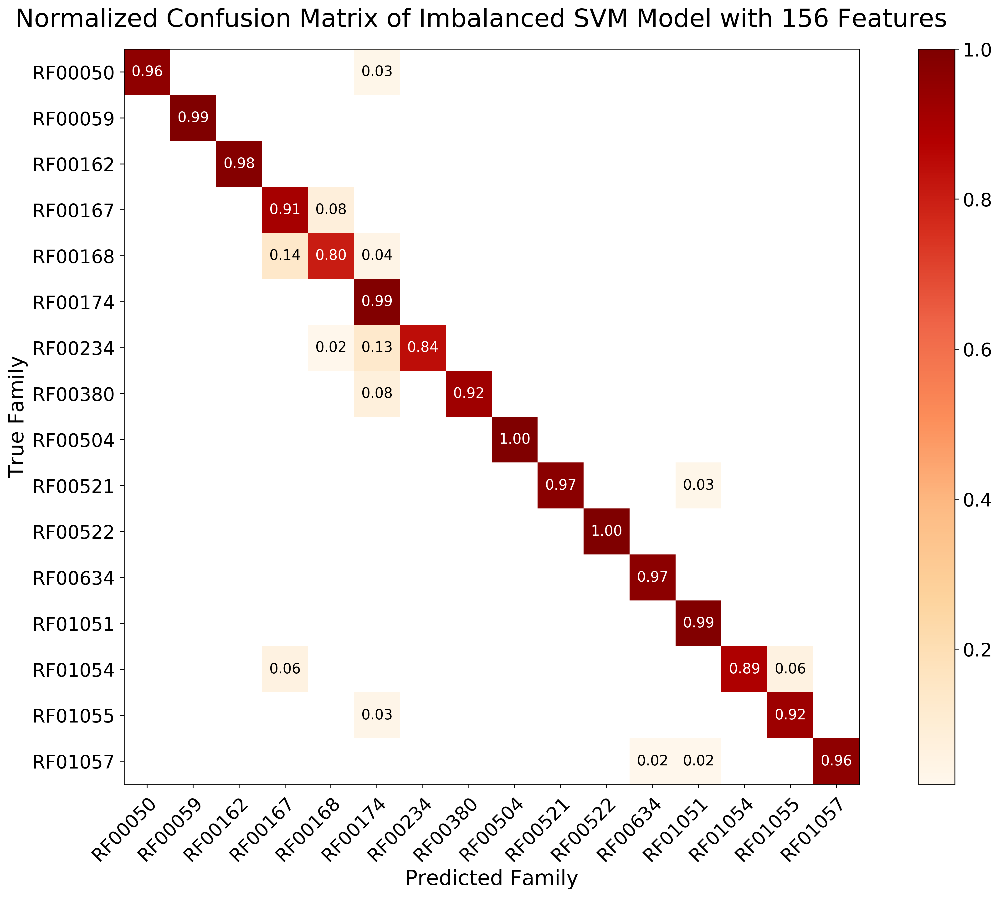

Normalized confusion matrix


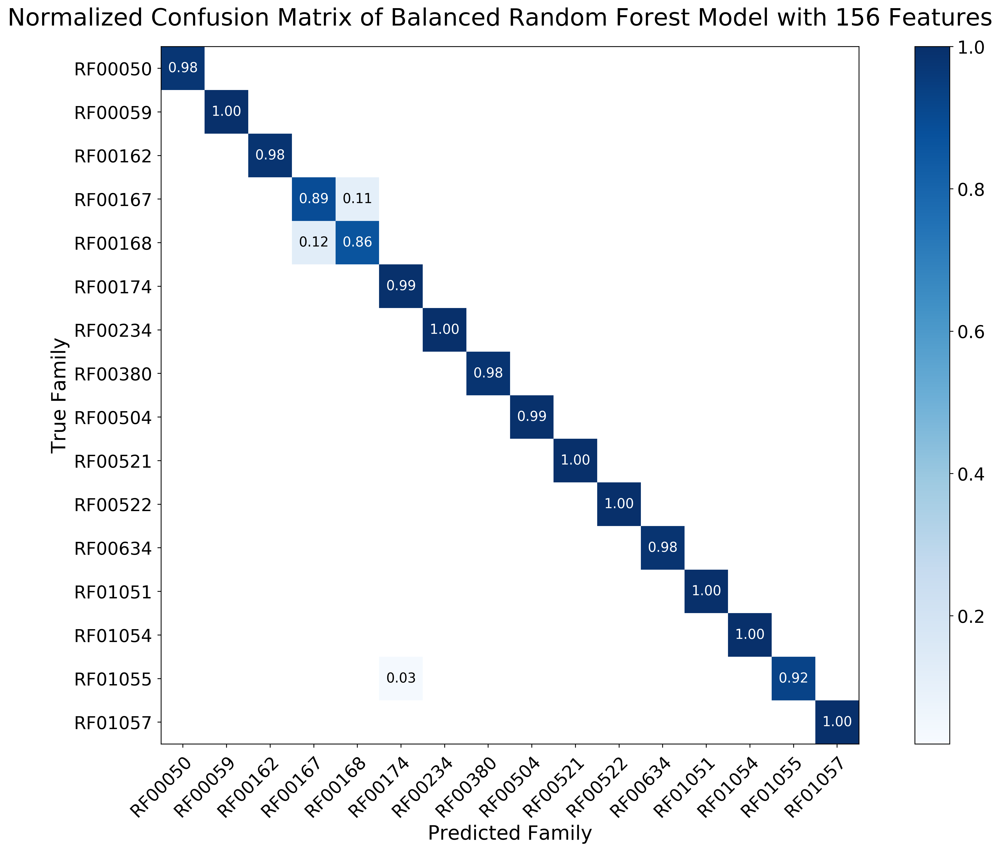

Normalized confusion matrix


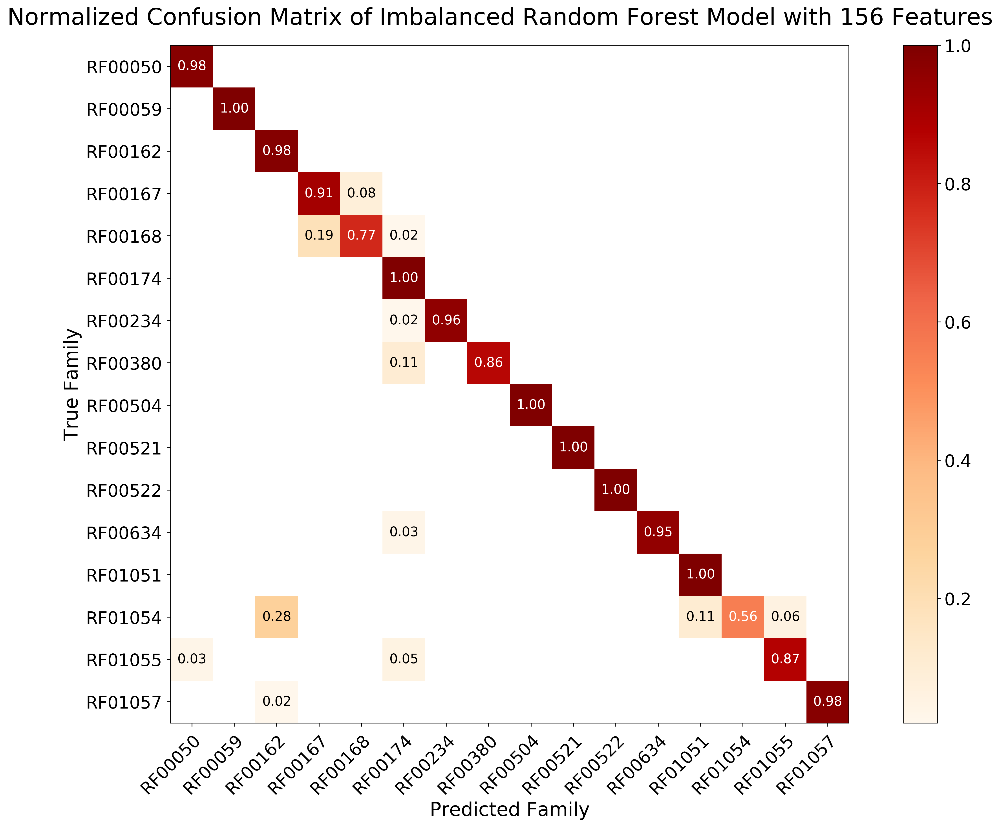

Normalized confusion matrix


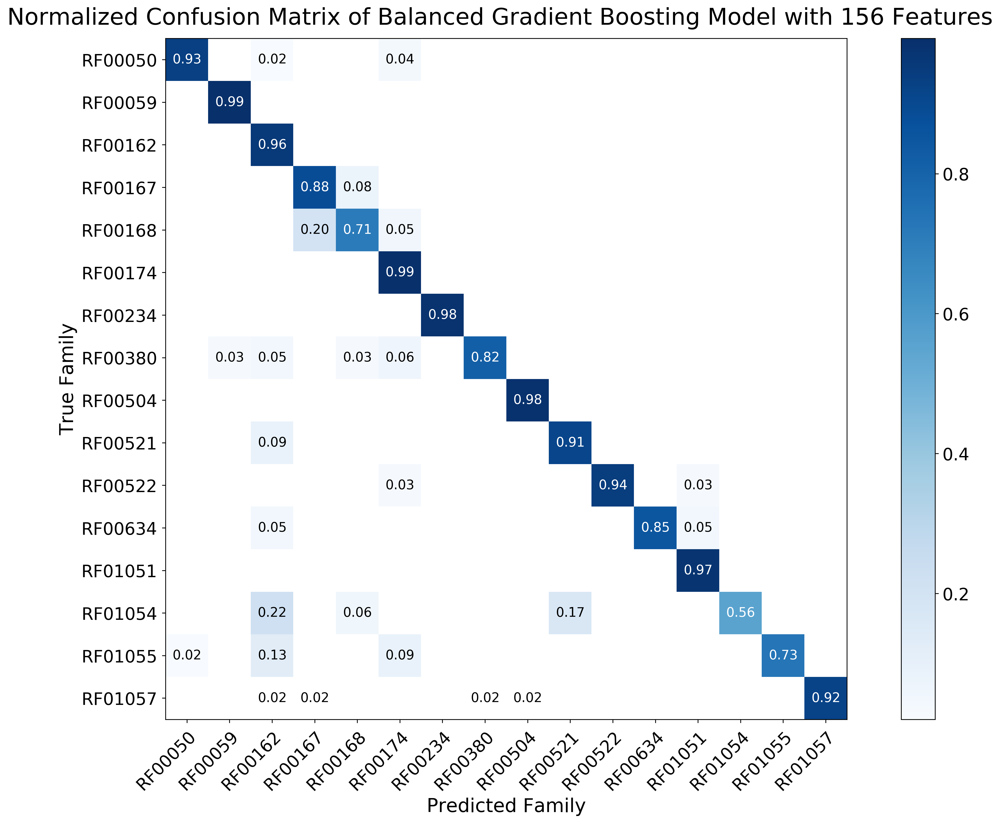

Normalized confusion matrix


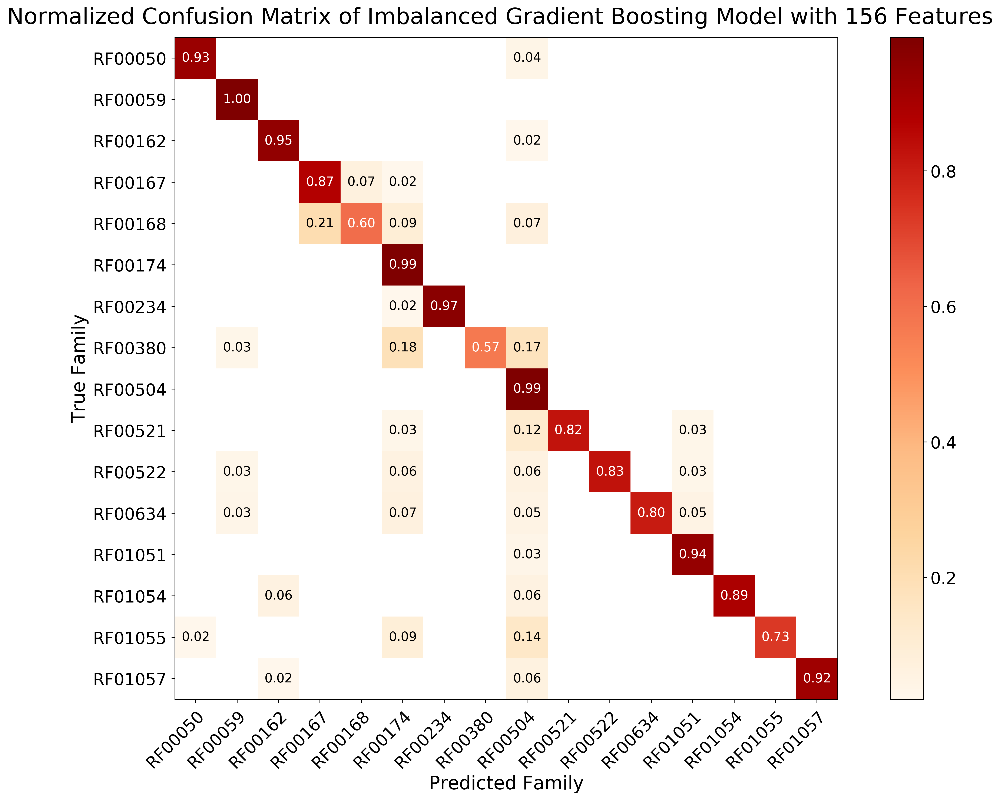

Normalized confusion matrix


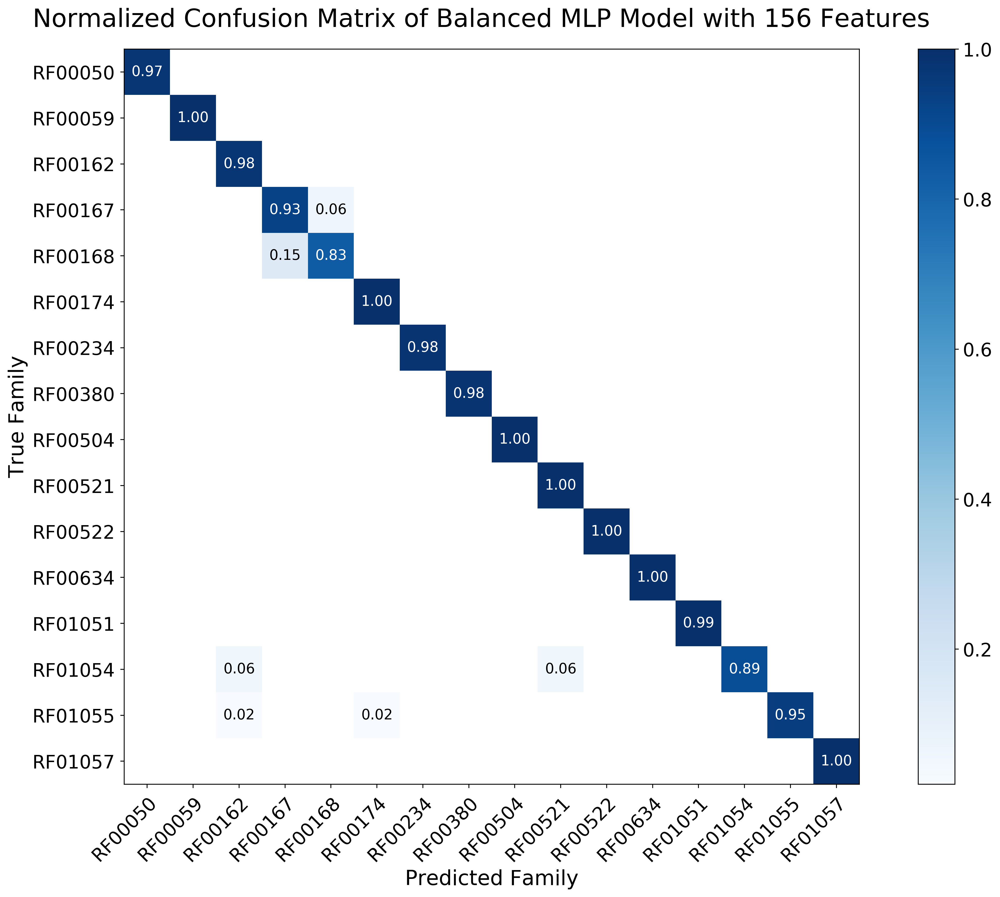

Normalized confusion matrix


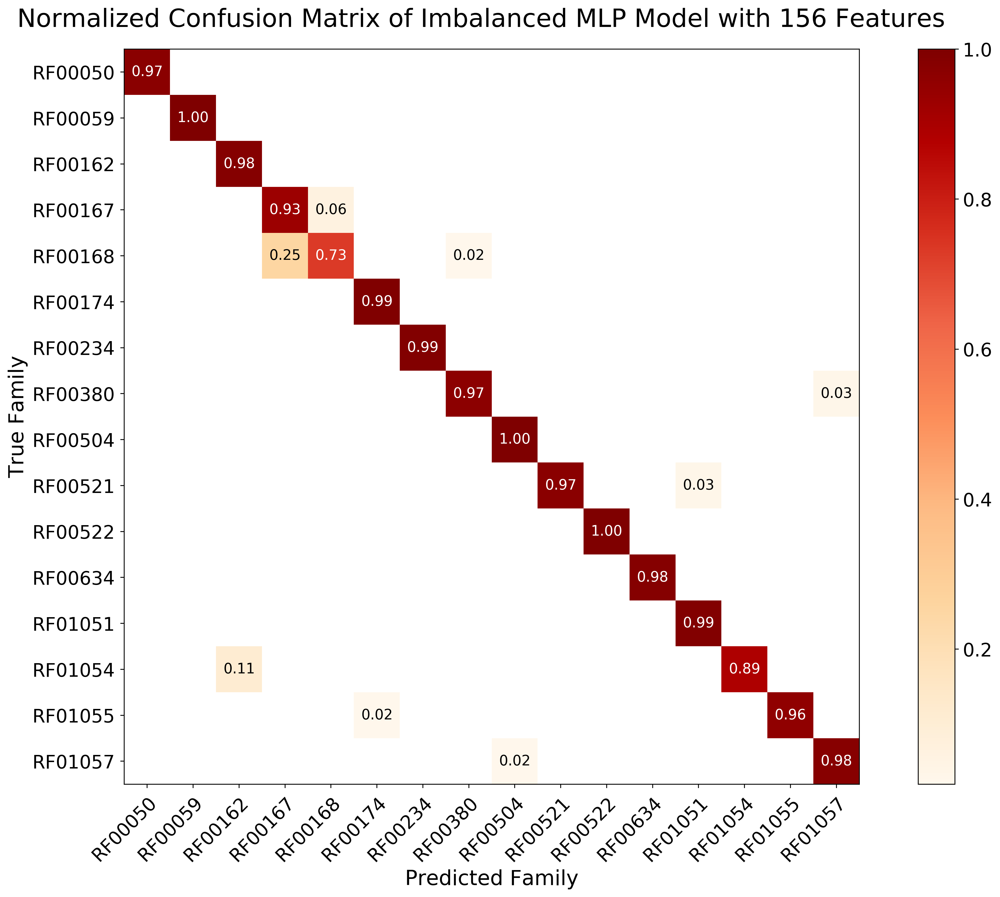

Normalized confusion matrix


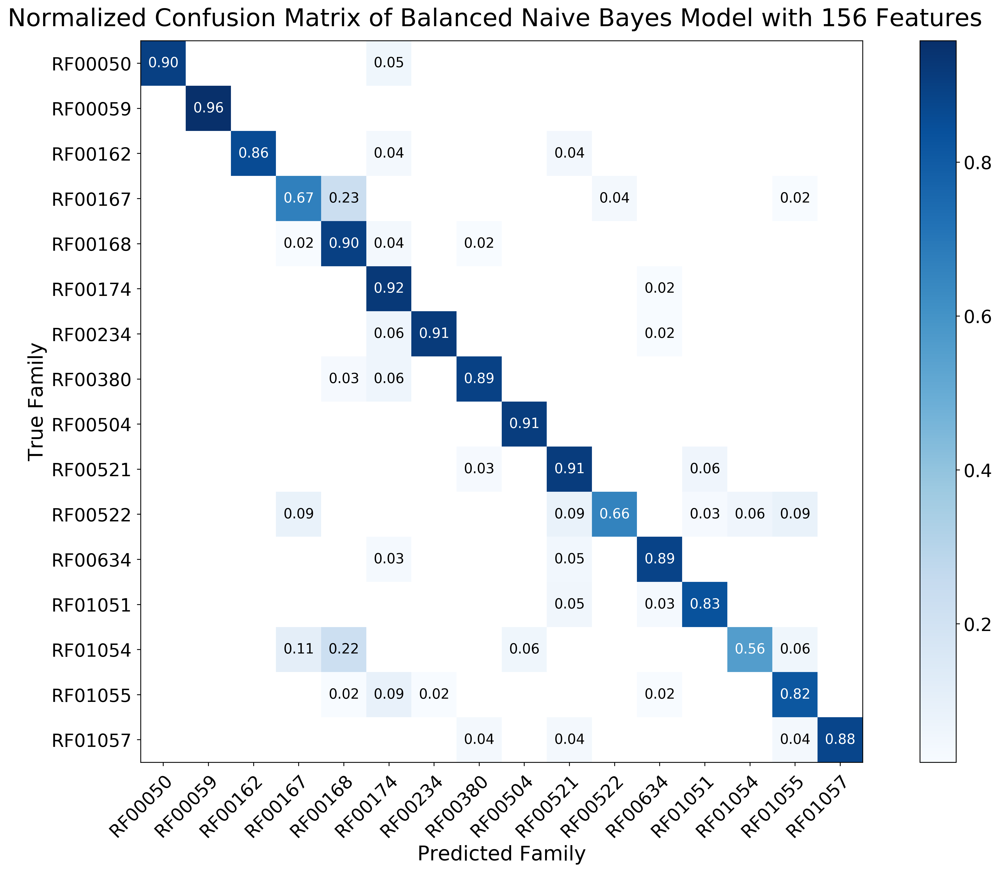

Normalized confusion matrix


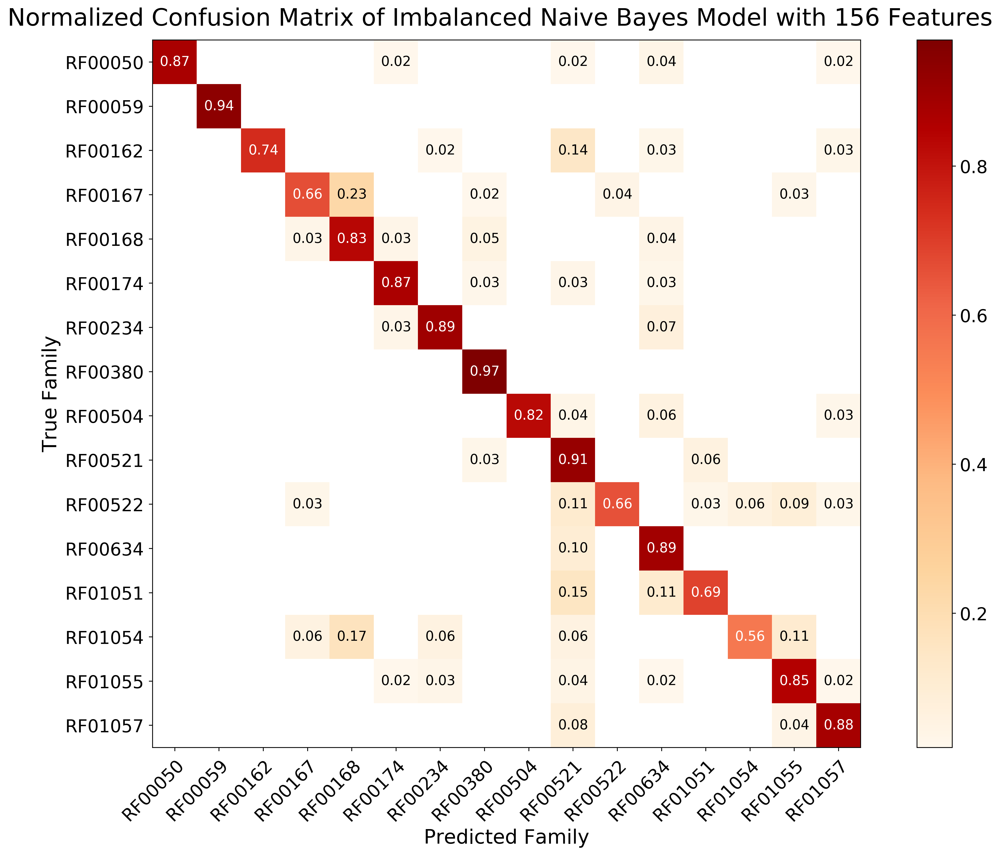

In [14]:
for model_name, balance in zip(models_names.keys(),models_names.values()):
    model = load(model_name)
    if balance == 'Imbalanced':
        cmap = plt.cm.OrRd
    else:
        cmap = plt.cm.Blues
    plot_confusion_matrix(model, models_transfer[model_name], label, balance = balance, normalize = True, cmap = cmap)

# kmer-family clustering heatmap(figure 2)

<Figure size 432x288 with 0 Axes>

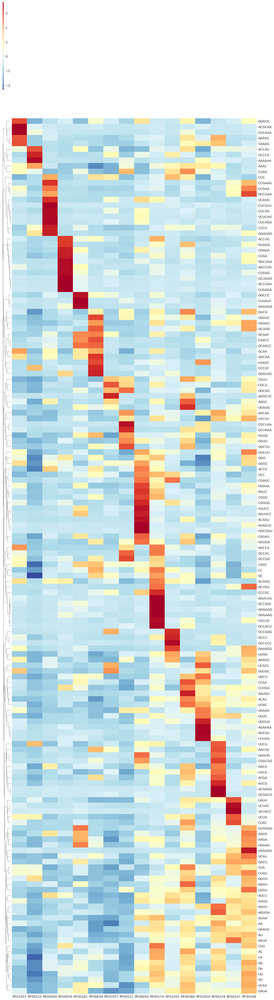

In [406]:
cbar_kws = {
            'orientation':'vertical',
            'shrink':3,
            'ticks':np.arange(-5, 5),
            "drawedges":True,
            'extendfrac':0.5
           }

plt.figure()
ax = sns.clustermap(heat_norm_modi.T, cmap = 'RdYlBu_r', figsize= (16, 80), z_score=0, cbar_kws=cbar_kws, center = 0.6, col_cluster=False)
plt.savefig('test.pdf', dpi = 330)
# ax=sns.heatmap(heat_norm.T, cbar= True, linewidths = 1, cmap = 'Blues', cbar_kws = cbar_kws, center = 0.6)

<Figure size 432x288 with 0 Axes>

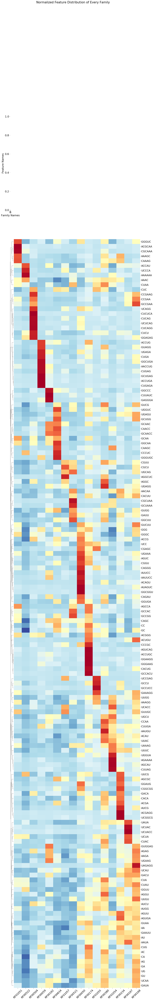

In [68]:
plot_feature_distribution_heatmap(heat_norm_modi, label, featurenames, cmp = 'RdYlBu_r')